# KAISD
Korean language Alcohol Intoxicated Speech Detector

# Prerequisite: Mount your gdrive and set root.

In [1]:
import os
from google.colab import drive
drive.mount('/gdrive', force_remount=True)
root = '/gdrive/My Drive/2020 Fall CS470 Group Project/'

Mounted at /gdrive


# Import libraries 

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

# Tensorboard

In [ ]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()
%load_ext tensorboard
%tensorboard --logdir=runs

Output hidden; open in https://colab.research.google.com to view.

# Utilities and basic settings

Here, we define data class for the model. A csv file is used to assign a correct label for each data. 


In [3]:
class KAISD_data(Dataset):
  def __init__(self, base_path, csv_path):
    self.df = pd.read_csv(csv_path)
    self.data = []
    self.labels = []
    self.c2i={}
    self.categories = sorted(self.df['label'].unique())
    for i, category in enumerate(self.categories):
      self.c2i[category]=i
    for j in tqdm(range(len(self.df))):
      row = self.df.iloc[j]
      file_path = os.path.join(base_path,row['filename'])
      file_data = load_audio(file_path, 8)
      self.data += file_data
      self.labels += [self.c2i[row['label'] ] ] * len (file_data)
  def __len__(self):
    return len(self.data)
  def __getitem__(self, idx):
    return self.data[idx], self.labels[idx]

# use GPU / CPU
if torch.cuda.is_available():
    device=torch.device('cuda:0')
    print("using cuda")
else:
    device=torch.device('cpu')
    print("using cpu")

# hyperparameters
num_epochs = 15
batch_size = 32

using cuda


# Load data
We load the preprocessed data, split them into train test and validation set.
This is done using pytorch's **Dataloader** package.

In [4]:
data_loader = torch.load(root + 'data_loader.pth')
full_data = data_loader.dataset
train_data_len = math.floor(len(full_data) * 0.8)
test_data_len = math.floor(len(full_data) * 0.1)
valid_data_len = len(full_data) - train_data_len - test_data_len
train_set, test_set, valid_set = torch.utils.data.random_split(full_data,[train_data_len, test_data_len, valid_data_len])
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)
valid_loader = DataLoader(valid_set, batch_size=batch_size, shuffle=False)

print(f"length of full_data: {len(full_data)}")
print(f"length of train_data: {len(train_set)}")
print(f"length of train_data: {len(test_set)}")
print(f"length of valid_data: {len(valid_set)}")
print(f"total batch number of train_data: {len(train_loader)}")
print(f"total batch number of test_data: {len(test_loader)}")
print(f"total batch number of valid_data: {len(valid_loader)}")

length of full_data: 4025
length of train_data: 3220
length of train_data: 402
length of valid_data: 403
total batch number of train_data: 101
total batch number of test_data: 13
total batch number of valid_data: 13


# Define model

## KAISD_naive/KAISD_pretrained
The following classes define ShallowConvModel and DeepConvModel. ShallowConvModel has 2 CNN layers, while DeepConvModel has 6 CNN layers.

In [5]:
class ShallowConvModel(nn.Module):
    def __init__(self):
        super().__init__()

        # ReLU
        self.act = nn.ReLU()

        # CNN layers (with max-pooling and dropout)
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=1)
        self.conv1_bn = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=4, stride=2)
        self.dropout1 = nn.Dropout(p=0.4)

        # FC layers (with dropout)
        self.fc1 = nn.Linear(659776, 256)
        self.dropout2 = nn.Dropout(p=0.3)
        self.fc2 = nn.Linear(256, 32)
        self.fc3 = nn.Linear(32, 2)

    def forward(self, x):
        x = self.act(self.conv1_bn(self.conv1(x)))
        x = self.act(self.conv2_bn(self.conv2(x)))
        x = self.pool1(x)
        x = self.dropout1(x)

        # Flattening to feed it to FC layers
        x = x.view(-1, x.shape[1:].numel())

        x = self.act(self.fc1(x))
        x = self.dropout2(x)
        x = self.act(self.fc2(x))
        x = self.fc3(x)
        return x
        
    def load_pretrained(self, pretrained_model):
        pre_conv1 = pretrained_model.conv1
        pre_conv1_bn = pretrained_model.conv1_bn
        pre_conv2 = pretrained_model.conv2
        pre_conv2_bn = pretrained_model.conv2_bn
        pre_fc1 = pretrained_model.fc1
        pre_fc2 = pretrained_model.fc2
        pre_fc3 = pretrained_model.fc3
        conv1_states = pre_conv1.state_dict()
        conv1_bn_states = pre_conv1_bn.state_dict()
        conv2_states = pre_conv2.state_dict()
        conv2_bn_states = pre_conv2_bn.state_dict()
        fc1_states = pre_fc1.state_dict()
        fc2_states = pre_fc2.state_dict()
        fc3_states = pre_fc3.state_dict()
        self.conv1.load_state_dict(conv1_states)
        self.conv1_bn.load_state_dict(conv1_bn_states)
        self.conv2.load_state_dict(conv2_states)
        self.conv2_bn.load_state_dict(conv2_bn_states)
        # cannot load weights of fc1 due to shape difference
        # self.fc1.load_state_dict(fc1_states)
        self.fc2.load_state_dict(fc2_states)
        # cannot load weights of fc3 due to shape difference
        # self.fc3.load_state_dict(fc3_states)

In [6]:
class DeepConvModel(nn.Module):
    def __init__(self):
        super().__init__()

        # ReLU
        self.act = nn.ReLU()

        # CNN layers (with max-pooling and dropout)
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=1)
        self.conv1_bn = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=4, stride=2)
        self.dropout1 = nn.Dropout(p=0.4)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=[1, 2])
        self.conv3_bn = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=4, stride=2)
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=[1, 2])
        self.conv4_bn = nn.BatchNorm2d(64)
        self.pool3 = nn.MaxPool2d(kernel_size=3, stride=[1, 2])
        self.conv5 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=2)
        self.conv5_bn = nn.BatchNorm2d(64)
        self.conv6 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=2)
        self.conv6_bn = nn.BatchNorm2d(64)

        # FC layers (with dropout)
        self.fc1 = nn.Linear(320, 256)
        self.dropout2 = nn.Dropout(p=0.3)
        self.fc2 = nn.Linear(256, 32)
        self.fc3 = nn.Linear(32, 2)

    def forward(self, x):
        x = self.act(self.conv1_bn(self.conv1(x)))
        x = self.act(self.conv2_bn(self.conv2(x)))
        x = self.pool1(x)
        x = self.dropout1(x)
        x = self.act(self.conv3_bn(self.conv3(x)))
        x = self.pool2(x)
        x = self.act(self.conv4_bn(self.conv4(x)))
        x = self.pool3(x)
        x = self.act(self.conv5_bn(self.conv5(x)))
        x = self.act(self.conv6_bn(self.conv6(x)))

        # Flattening to feed it to FC layers
        x = x.view(-1, x.shape[1:].numel())

        x = self.act(self.fc1(x))
        x = self.dropout2(x)
        x = self.act(self.fc2(x))
        x = self.fc3(x)
        return x
        
    def load_pretrained(self, pretrained_model):
        pre_conv1 = pretrained_model.conv1
        pre_conv1_bn = pretrained_model.conv1_bn
        pre_conv2 = pretrained_model.conv2
        pre_conv2_bn = pretrained_model.conv2_bn
        pre_conv3 = pretrained_model.conv4
        pre_conv3_bn = pretrained_model.conv4_bn
        pre_conv4 = pretrained_model.conv5
        pre_conv4_bn = pretrained_model.conv5_bn
        pre_fc1 = pretrained_model.fc1
        pre_fc2 = pretrained_model.fc2
        pre_fc3 = pretrained_model.fc3
        conv1_states = pre_conv1.state_dict()
        conv1_bn_states = pre_conv1_bn.state_dict()
        conv2_states = pre_conv2.state_dict()
        conv2_bn_states = pre_conv2_bn.state_dict()
        conv3_states = pre_conv3.state_dict()
        conv3_bn_states = pre_conv3_bn.state_dict()
        conv4_states = pre_conv4.state_dict()
        conv4_bn_states = pre_conv4_bn.state_dict()
        fc1_states = pre_fc1.state_dict()
        fc2_states = pre_fc2.state_dict()
        fc3_states = pre_fc3.state_dict()
        self.conv1.load_state_dict(conv1_states)
        self.conv1_bn.load_state_dict(conv1_bn_states)
        self.conv2.load_state_dict(conv2_states)
        self.conv2_bn.load_state_dict(conv2_bn_states)
        self.conv3.load_state_dict(conv3_states)
        self.conv3_bn.load_state_dict(conv3_bn_states)
        self.conv4.load_state_dict(conv4_states)
        self.conv4_bn.load_state_dict(conv4_bn_states)
        # cannot load weights of fc1 due to shape difference
        # self.fc1.load_state_dict(fc1_states)
        self.fc2.load_state_dict(fc2_states)
        # cannot load weights of fc3 due to shape difference
        # self.fc3.load_state_dict(fc3_states)

## KAISD_inception
The following class defines the model for KAISD_inception, which consists of inception modules, CNN layers and FC layers.

In [7]:
class InceptionBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(InceptionBlock, self).__init__()
        assert out_channels%8==0, 'out channel should be mutiplier of 8'

        self.act = nn.ReLU()

        # for conv1x1 branch
        b1_out = out_channels//4
        self.b1conv = nn.Conv2d(in_channels=in_channels, out_channels=b1_out, kernel_size=1, stride=1, padding=0, bias=False)
        self.b1bn = nn.BatchNorm2d(b1_out)

        # for conv3x3 branch
        b2_out = out_channels//2
        self.b2conv1 = nn.Conv2d(in_channels=in_channels, out_channels=b2_out, kernel_size=1, stride=1, padding=0, bias=False)
        self.b2bn1 = nn.BatchNorm2d(b2_out)
        self.b2conv2 = nn.Conv2d(in_channels=b2_out, out_channels=b2_out, kernel_size=3, stride=1, padding=1, bias=False)
        self.b2bn2 = nn.BatchNorm2d(b2_out)

        # for conv5x5 branch
        b3_out = out_channels//8
        self.b3conv1 = nn.Conv2d(in_channels=in_channels, out_channels=b3_out, kernel_size=1, stride=1, padding=0, bias=False)
        self.b3bn1 = nn.BatchNorm2d(b3_out)
        self.b3conv2 = nn.Conv2d(in_channels=b3_out, out_channels=b3_out, kernel_size=5, stride=1, padding=2, bias=False)
        self.b3bn2 = nn.BatchNorm2d(b3_out)

        # for maxpool branch
        mx_out = b3_out
        self.mx = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
        self.mxconv = nn.Conv2d(in_channels=in_channels, out_channels=mx_out, kernel_size=1, stride=1, padding=0, bias=False)
        self.mxbn = nn.BatchNorm2d(mx_out)

    def forward(self, x): 
        output1 = self.act(self.b1bn(self.b1conv(x)))
        output2 = self.act(self.b2bn1(self.b2conv1(x)))
        output2 = self.act(self.b2bn2(self.b2conv2(output2)))
        output3 = self.act(self.b3bn1(self.b3conv1(x)))
        output3 = self.act(self.b3bn2(self.b3conv2(output3)))
        output4 = self.act(self.mxbn(self.mxconv(self.mx(x))))
        output = torch.cat((output1, output2, output3, output4), 1)
        return output

class InceptionModel(nn.Module):
    def __init__(self, nf, num_blocks):
        super(InceptionModel, self).__init__()
 
        block = InceptionBlock
        block_args = lambda x: (x, x)

        self.block1 = nn.Sequential(*[block(*block_args(nf)) for _ in range(num_blocks[0])])
        self.block2 = nn.Sequential(*[block(*block_args(nf*2)) for _ in range(num_blocks[1])])
        self.block3 = nn.Sequential(*[block(*block_args(nf*4)) for _ in range(num_blocks[2])])

        self.conv1 = nn.Conv2d(in_channels=1, out_channels=nf, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(nf)
        self.act = nn.ReLU()
        self.mx = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=nf, out_channels=nf*2, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(nf*2)
        self.conv3 = nn.Conv2d(in_channels=nf*2, out_channels=nf*4, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn3 = nn.BatchNorm2d(nf*4)
        self.avg = nn.AdaptiveAvgPool2d((1,1))
        self.fltn = nn.Flatten()
        self.lnr = nn.Linear(nf*4, 2)

    def forward(self, x):
        output = self.mx(self.act(self.bn1(self.conv1(x))))
        output = self.block1(output)
        output = self.mx(self.act(self.bn2(self.conv2(output))))
        output = self.block2(output)
        output = self.mx(self.act(self.bn3(self.conv3(output))))
        output = self.block3(output)
        output = self.lnr(self.fltn(self.avg(output)))

        return output

# Initialize models and set model paths

In [8]:
# model paths
shallow_conv_model_path = root + 'models/with_modification/' + 'shallow_conv_model.pt'
shallow_pretrained_model_path = root + 'models/with_modification/' + 'shallow_pretrained_model.pt'
deep_conv_model_path = root + 'models/with_modification/' + 'deep_conv_model.pt'
deep_pretrained_model_path = root + 'models/with_modification/' + 'deep_pretrained_model.pt'
inception_model_path_1 = root + 'models/with_modification/' + 'inception_model_1.pt'
inception_model_path_2 = root + 'models/with_modification/' + 'inception_model_2.pt'
inception_model_path_3 = root + 'models/with_modification/' + 'inception_model_3.pt'
inception_model_path_4 = root + 'models/with_modification/' + 'inception_model_4.pt'
inception_model_path_5 = root + 'models/without_modification/' + 'inception_model.pt'
inception_model_path_6 = root + 'models/with_modification/' + 'inception_model_6.pt'
inception_model_path_7 = root + 'models/with_modification/' + 'inception_model_7.pt'

In [9]:
# initialize KAISD_naive models
shallow_conv_model = ShallowConvModel().to(device)
deep_conv_model = DeepConvModel().to(device)

In [10]:
# initialize KAISD_pretrained

# alco_audio model (for preloading weights)
class AlcoAudio(nn.Module):

    def __init__(self):
        super(AlcoAudio, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, stride=1)
        self.conv1_bn = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=4, stride=2)
        self.dropout0 = nn.Dropout(p=0.4)
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=[1, 2])
        self.conv4_bn = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=4, stride=2)
        self.conv5 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=[1, 2])
        self.conv5_bn = nn.BatchNorm2d(64)
        self.pool3 = nn.MaxPool2d(kernel_size=3, stride=[1, 2])
        self.fc1 = nn.Linear(2560, 256)
        self.dropout1 = nn.Dropout(p=0.3)
        self.fc2 = nn.Linear(256, 32)
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = x.unsqueeze(1)
        x = F.relu(self.conv1_bn(self.conv1(x)))
        x = F.relu(self.conv2_bn(self.conv2(x)))
        x = self.pool1(x)
        x = self.dropout0(x)
        x = F.relu(self.conv4_bn(self.conv4(x)))
        x = self.pool2(x)
        x = F.relu(self.conv5_bn(self.conv5(x)))
        x = self.pool3(x)

        # Flattening to feed it to FFN
        x = x.view(-1, x.shape[1:].numel())
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# get alco_audio model
pretrained_alco_audio = AlcoAudio()
pretrained_alco_audio.load_state_dict(torch.load(root + 'alco_audio_model.pt', map_location=device))

# load pretrained weights for alco_audio model
shallow_pretrained_model = ShallowConvModel().to(device)
shallow_pretrained_model.load_pretrained(pretrained_alco_audio)
deep_pretrained_model = DeepConvModel().to(device)
deep_pretrained_model.load_pretrained(pretrained_alco_audio)

In [11]:
# initialize KAISD_inception
inception_model_1 = InceptionModel(nf=64, num_blocks=[1,1,1]).to(device)
inception_model_2 = InceptionModel(nf=64, num_blocks=[2,2,2]).to(device)
inception_model_3 = InceptionModel(nf=64, num_blocks=[3,3,3]).to(device)
inception_model_4 = InceptionModel(nf=64, num_blocks=[4,4,4]).to(device)
inception_model_5 = InceptionModel(nf=64, num_blocks=[5,5,5]).to(device)
inception_model_6 = InceptionModel(nf=64, num_blocks=[6,6,6]).to(device)
inception_model_7 = InceptionModel(nf=64, num_blocks=[7,7,7]).to(device)

# Define functions for training and testing

We define several functions for training and testing. Cross entropy loss was used to calculate the loss for training.

In [12]:
def test_net(model, data_loader):
  correct = 0
  total = 0

  model.eval() # convert model to evaluation mode
  with torch.no_grad():
      for (audio, label) in data_loader:
          audio = audio.to(device, dtype=torch.float32)
          label = label.to(device, dtype=torch.long)
          outputs = model(audio)
          predicted = torch.argmax(outputs.data, dim=1)
          total += label.size(0)
          correct += (predicted == label).sum().item()

  accuracy = 100 * (correct / total)
  print(f"correct: {correct}, total: {total}")
  print('Accuracy of the network: %d %%' % accuracy )
  return accuracy

def train_net(model, model_path):
  running_loss = 0.0
  batch_num = len(train_loader)
  best_acc = 0

  criterion = nn.CrossEntropyLoss()
  optimizer = optim.SGD(model.parameters(), lr=0.0005, momentum=0.9)

  for epoch in tqdm(range (num_epochs), disable=True):
    model.train() # convert model to training mode
    for batch_idx, (audio, label) in enumerate(train_loader):
        audio = audio.to(device, dtype=torch.float32)
        label = label.to(device, dtype=torch.long)
        outputs = model(audio)
        predicted = torch.argmax(outputs.data, dim=1)
        # print("predicted labels")
        # print(predicted)
        # print("actual labels")
        # print(label)
        loss = criterion(outputs, label)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss = loss.item()
        print(f'[Epoch: {epoch + 1}, Batch is {batch_idx + 1}/{batch_num}] Loss: {running_loss}')
        writer.add_scalar("train_loss", loss, epoch)

    # calculate accuracy using test_set for each epoch
    acc = test_net(model, test_loader)
    print(f"Validation accuracy of epoch {epoch + 1} is {acc}")
    writer.add_scalar("val_accauracy", acc, epoch + 1)

    # save model with highest validation accuracy
    if acc > best_acc:
      best_acc = acc
      torch.save(model.state_dict(), model_path)
      print("NEW BEST ACCURACY, model saved!")

  print('Finished Training')

def test_by_label(model, data_loader):
  classes = ["sober", "drunk"]
  class_correct = list(0 for i in range(2))
  class_total = list(0 for i in range(2))
  with torch.no_grad():
      for data in data_loader:
          audio, label = data
          audio = audio.to(device, dtype=torch.float32)
          label = label.to(device, dtype=torch.long)
          outputs = model(audio)
          predicted = torch.argmax(outputs.data, dim=1)
          c = (predicted == label).squeeze()
          for i in range(len(c)):
              correct_label = label[i]
              class_correct[correct_label] += c[i].item()
              class_total[correct_label] += 1

  for i in range(2):
      # print('Accuracy of %5s : %2d %%' % (
      #     classes[i], 100 * class_correct[i] / class_total[i]))
      print(f"number of correct predictions for {classes[i]} is {class_correct[i]}")
      print( f"number of {classes[i]} data is {class_total[i]}")
  precision = class_correct[1]/(class_correct[1]+(class_total[0]-class_correct[0]))
  recall = class_correct[1]/class_total[1]
  print(f"precision: {precision}")
  print(f"recall: {recall}")
  print(f"F1 score: {2*precision*recall/(precision+recall)}")

# Train the network

In [ ]:
# train_net(shallow_conv_model, shallow_conv_model_path)
# train_net(deep_conv_model, deep_conv_model_path)
# train_net(shallow_pretrained_model, shallow_pretrained_model_path)
# train_net(deep_pretrained_model, deep_pretrained_model_path)
# train_net(inception_model_1, inception_model_path_1)
# train_net(inception_model_2, inception_model_path_2)
# train_net(inception_model_3, inception_model_path_3)
# train_net(inception_model_4, inception_model_path_4)
# train_net(inception_model_5, inception_model_path_5)
# train_net(inception_model_6, inception_model_path_6)
# train_net(inception_model_7, inception_model_path_7)
writer.flush()
writer.close()

# Test the network

## Load models

In [13]:
# KAISD_naive
KAISD_naive_shallow = ShallowConvModel().to(device)
KAISD_naive_shallow.load_state_dict(torch.load(shallow_conv_model_path))
KAISD_naive_deep = DeepConvModel().to(device)
KAISD_naive_deep.load_state_dict(torch.load(deep_conv_model_path))

# KAISD_pretrained
KAISD_pretrained_shallow = ShallowConvModel().to(device)
KAISD_pretrained_shallow.load_state_dict(torch.load(shallow_pretrained_model_path))
KAISD_pretrained_deep = DeepConvModel().to(device)
KAISD_pretrained_deep.load_state_dict(torch.load(deep_pretrained_model_path))

# KAISD_inception
KAISD_inception_1 = InceptionModel(nf=64, num_blocks=[1,1,1]).to(device)
KAISD_inception_1.load_state_dict(torch.load(inception_model_path_1))
KAISD_inception_2 = InceptionModel(nf=64, num_blocks=[2,2,2]).to(device)
KAISD_inception_2.load_state_dict(torch.load(inception_model_path_2))
KAISD_inception_3 = InceptionModel(nf=64, num_blocks=[3,3,3]).to(device)
KAISD_inception_3.load_state_dict(torch.load(inception_model_path_3))
KAISD_inception_4 = InceptionModel(nf=64, num_blocks=[4,4,4]).to(device)
KAISD_inception_4.load_state_dict(torch.load(inception_model_path_4))
KAISD_inception_5 = InceptionModel(nf=64, num_blocks=[5,5,5]).to(device)
KAISD_inception_5.load_state_dict(torch.load(inception_model_path_5))
KAISD_inception_6 = InceptionModel(nf=64, num_blocks=[6,6,6]).to(device)
KAISD_inception_6.load_state_dict(torch.load(inception_model_path_6))
KAISD_inception_7 = InceptionModel(nf=64, num_blocks=[7,7,7]).to(device)
KAISD_inception_7.load_state_dict(torch.load(inception_model_path_7))

<All keys matched successfully>

## Overall accuracy using valid_set

In [ ]:
# KAISD_naive
print("overall accuracy of KAISD_naive_shallow")
test_net(KAISD_naive_shallow, valid_loader)
print("")
print("overall accuracy of KAISD_naive_deep")
test_net(KAISD_naive_deep, valid_loader)
print("")

# KAISD_pretrained
print("overall accuracy of KAISD_pretrained_shallow")
test_net(KAISD_pretrained_shallow, valid_loader)
print("")
print("overall accuracy of KAISD_pretrained_deep")
test_net(KAISD_pretrained_deep, valid_loader)
print("")

# KAISD_inception
print("overall accuracy of KAISD_inception_1")
test_net(KAISD_inception_1, valid_loader)
print("")
print("overall accuracy of KAISD_inception_2")
test_net(KAISD_inception_2, valid_loader)
print("")
print("overall accuracy of KAISD_inception_3")
test_net(KAISD_inception_3, valid_loader)
print("")
print("overall accuracy of KAISD_inception_4")
test_net(KAISD_inception_4, valid_loader)
print("")
print("overall accuracy of KAISD_inception_5")
test_net(KAISD_inception_5, valid_loader)
print("")
print("overall accuracy of KAISD_inception_6")
test_net(KAISD_inception_6, valid_loader)
print("")
print("overall accuracy of KAISD_inception_7")
test_net(KAISD_inception_7, valid_loader)
print("")

overall accuracy of KAISD_naive_shallow
correct: 346, total: 403
Accuracy of the network: 85 %

overall accuracy of KAISD_naive_deep
correct: 250, total: 403
Accuracy of the network: 62 %

overall accuracy of KAISD_pretrained_shallow
correct: 348, total: 403
Accuracy of the network: 86 %

overall accuracy of KAISD_pretrained_deep
correct: 305, total: 403
Accuracy of the network: 75 %

overall accuracy of KAISD_inception_1
correct: 375, total: 403
Accuracy of the network: 93 %

overall accuracy of KAISD_inception_2
correct: 369, total: 403
Accuracy of the network: 91 %

overall accuracy of KAISD_inception_3
correct: 382, total: 403
Accuracy of the network: 94 %

overall accuracy of KAISD_inception_4
correct: 363, total: 403
Accuracy of the network: 90 %

overall accuracy of KAISD_inception_5
correct: 385, total: 403
Accuracy of the network: 95 %

overall accuracy of KAISD_inception_6
correct: 370, total: 403
Accuracy of the network: 91 %

overall accuracy of KAISD_inception_7
correct: 3

## Test by label
This data is used to calculate precision, recall and F1 score.

In [ ]:
# KAISD_naive
print("accuracy by label for KAISD_naive_shallow")
test_by_label(KAISD_naive_shallow, valid_loader)
print("")
print("accuracy by label for KAISD_naive_deep")
test_by_label(KAISD_naive_deep, valid_loader)
print("")

# KAISD_pretrained
print("accuracy by label for KAISD_pretrained_shallow")
test_by_label(KAISD_pretrained_shallow, valid_loader)
print("")
print("accuracy by label for KAISD_pretrained_deep")
test_by_label(KAISD_pretrained_deep, valid_loader)
print("")

# KAISD_inception
print("accuracy by label for KAISD_inception_1")
test_by_label(KAISD_inception_1, valid_loader)
print("")
print("accuracy by label for KAISD_inception_2")
test_by_label(KAISD_inception_2, valid_loader)
print("")
print("accuracy by label for KAISD_inception_3")
test_by_label(KAISD_inception_3, valid_loader)
print("")
print("accuracy by label for KAISD_inception_4")
test_by_label(KAISD_inception_4, valid_loader)
print("")
print("accuracy by label for KAISD_inception_5")
test_by_label(KAISD_inception_5, valid_loader)
print("")
print("accuracy by label for KAISD_inception_6")
test_by_label(KAISD_inception_6, valid_loader)
print("")
print("accuracy by label for KAISD_inception_7")
test_by_label(KAISD_inception_7, valid_loader)
print("")

accuracy by label for KAISD_naive_shallow
number of correct predictions for sober is 168
number of sober data is 196
number of correct predictions for drunk is 178
number of drunk data is 207
precision: 0.8640776699029126
recall: 0.8599033816425121
F1 score: 0.8619854721549638

accuracy by label for KAISD_naive_deep
number of correct predictions for sober is 183
number of sober data is 196
number of correct predictions for drunk is 67
number of drunk data is 207
precision: 0.8375
recall: 0.32367149758454106
F1 score: 0.46689895470383275

accuracy by label for KAISD_pretrained_shallow
number of correct predictions for sober is 166
number of sober data is 196
number of correct predictions for drunk is 182
number of drunk data is 207
precision: 0.8584905660377359
recall: 0.8792270531400966
F1 score: 0.8687350835322196

accuracy by label for KAISD_pretrained_deep
number of correct predictions for sober is 137
number of sober data is 196
number of correct predictions for drunk is 168
number

## Test with heldout subject

We test the trained network with a completely new dataset. 

In [ ]:
# load held_out data
held_out_loader = torch.load(root + 'held_out.pth')
print(f"length of held_out_data: {len(held_out_loader.dataset)}")
print(f"total batch number of held_out_data: {len(held_out_loader)}")
print("")

# KAISD_naive
print("overall accuracy of KAISD_naive_shallow")
test_net(KAISD_naive_shallow, held_out_loader)
print("")
print("overall accuracy of KAISD_naive_deep")
test_net(KAISD_naive_deep, held_out_loader)
print("")

# KAISD_pretrained
print("overall accuracy of KAISD_pretrained_shallow")
test_net(KAISD_pretrained_shallow, held_out_loader)
print("")
print("overall accuracy of KAISD_pretrained_deep")
test_net(KAISD_pretrained_deep, held_out_loader)
print("")

# KAISD_inception
print("overall accuracy of KAISD_inception_1")
test_net(KAISD_inception_1, held_out_loader)
print("")
print("overall accuracy of KAISD_inception_2")
test_net(KAISD_inception_2, held_out_loader)
print("")
print("overall accuracy of KAISD_inception_3")
test_net(KAISD_inception_3, held_out_loader)
print("")
print("overall accuracy of KAISD_inception_4")
test_net(KAISD_inception_4, held_out_loader)
print("")
print("overall accuracy of KAISD_inception_5")
test_net(KAISD_inception_5, held_out_loader)
print("")
print("overall accuracy of KAISD_inception_6")
test_net(KAISD_inception_6, held_out_loader)
print("")
print("overall accuracy of KAISD_inception_7")
test_net(KAISD_inception_7, held_out_loader)
print("")

# KAISD_naive
print("accuracy by label for KAISD_naive_shallow")
test_by_label(KAISD_naive_shallow, held_out_loader)
print("")
print("accuracy by label for KAISD_naive_deep")
test_by_label(KAISD_naive_deep, held_out_loader)
print("")

# KAISD_pretrained
print("accuracy by label for KAISD_pretrained_shallow")
test_by_label(KAISD_pretrained_shallow, held_out_loader)
print("")
print("accuracy by label for KAISD_pretrained_deep")
test_by_label(KAISD_pretrained_deep, held_out_loader)
print("")

# KAISD_inception
print("accuracy by label for KAISD_inception_1")
test_by_label(KAISD_inception_1, held_out_loader)
print("")
print("accuracy by label for KAISD_inception_2")
test_by_label(KAISD_inception_2, held_out_loader)
print("")
print("accuracy by label for KAISD_inception_3")
test_by_label(KAISD_inception_3, held_out_loader)
print("")
print("accuracy by label for KAISD_inception_4")
test_by_label(KAISD_inception_4, held_out_loader)
print("")
print("accuracy by label for KAISD_inception_5")
test_by_label(KAISD_inception_5, held_out_loader)
print("")
print("accuracy by label for KAISD_inception_6")
test_by_label(KAISD_inception_6, held_out_loader)
print("")
print("accuracy by label for KAISD_inception_7")
test_by_label(KAISD_inception_7, held_out_loader)
print("")

length of held_out_data: 103
total batch number of held_out_data: 4

overall accuracy of KAISD_naive_shallow
correct: 81, total: 103
Accuracy of the network: 78 %

overall accuracy of KAISD_naive_deep
correct: 67, total: 103
Accuracy of the network: 65 %

overall accuracy of KAISD_pretrained_shallow
correct: 82, total: 103
Accuracy of the network: 79 %

overall accuracy of KAISD_pretrained_deep
correct: 83, total: 103
Accuracy of the network: 80 %

overall accuracy of KAISD_inception_1
correct: 54, total: 103
Accuracy of the network: 52 %

overall accuracy of KAISD_inception_2
correct: 51, total: 103
Accuracy of the network: 49 %

overall accuracy of KAISD_inception_3
correct: 57, total: 103
Accuracy of the network: 55 %

overall accuracy of KAISD_inception_4
correct: 55, total: 103
Accuracy of the network: 53 %

overall accuracy of KAISD_inception_5
correct: 70, total: 103
Accuracy of the network: 67 %

overall accuracy of KAISD_inception_6
correct: 50, total: 103
Accuracy of the netw

#QUaliatative results: FIlter visualization

In [122]:
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import torchvision.utils

# here, I used the valid loader set
audio, label = next(iter(valid_loader))

def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(100, 5))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Visualize feature from custom layers
class LayerActivation():
  features = None
  def __init__(self,model_layer):
    self.hook = model_layer.register_forward_hook(self.hook_fn)
  def hook_fn(self,module,input,output):
    self.features = output.cpu().data.numpy()
  def remove(self):
    self.hook.remove()

def visualize_feature (model, model_layer,input_num, audio):
  conv_out = LayerActivation(model_layer)
  audio = audio.to(device, dtype=torch.float32)
  output = model(audio)
  conv_out.remove()
  act = conv_out.features

  fig = plt.figure(figsize = (20,50))
  fig.subplots_adjust(left = 0, right=1, bottom=0, top=0.2, hspace=0, wspace=0.1 )
  for i in range(64):
    ax = fig.add_subplot(8,8,i+1,xticks = [], yticks= [])
    ax.imshow(act[input_num][i])


#This section is to see the labels for the audio data 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1,
        0, 1, 1, 0, 1, 1, 0, 0])


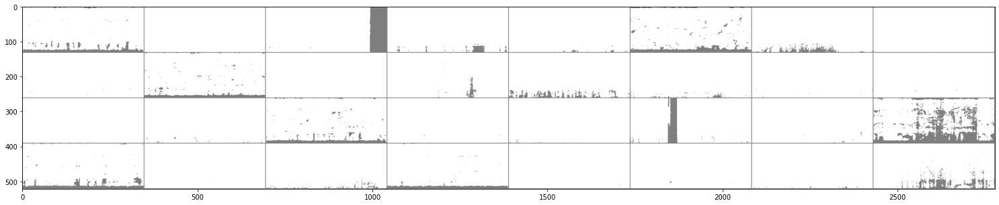

In [100]:
print(label)
audios = torchvision.utils.make_grid(audio).cpu()
imshow(audios)

#visualizing input data for the model

[Text(0.5, 1.0, 'Drunk')]

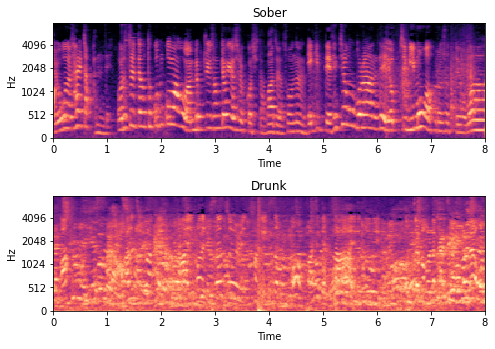

In [142]:
#get the index for each drunk and sober data within the loader's batch
fst_idx =12
snd_idx = 15
model = KAISD_naive_shallow

fig, axs = plt.subplots(2)
fig.subplots_adjust(left = 0, right=1, bottom=0, top=1, hspace=0.5, wspace=0.5 )
#display the actual mel spectrogram for first input
img1 = librosa.display.specshow(audio[fst_idx].numpy().squeeze(0), y_axis='mel', fmax=8000, x_axis='time', ax = axs[0])
axs[0].set(title = "Drunk" if label[fst_idx] else "Sober")
#plt.colorbar(img1, ax= axs[0], format='%+2.0f dB')

#display the actual mel spectrogram for second input
librosa.display.specshow(audio[snd_idx].numpy().squeeze(0), y_axis='mel', fmax=8000, x_axis='time', ax= axs[1])
axs[1].set(title = ( "Drunk" if label[snd_idx] else "Sober") )
# plt.title('Test Mel Spectrogram')
# plt.colorbar(format='%+2.0f dB')

#Chceking outputs

In [113]:

def test_if_true(idx):
  first_audio = audio[idx].unsqueeze(0).to(device, dtype=torch.float32)
  output = model(first_audio)
  predicted = torch.argmax(output.data, dim=1)
  print (predicted == label[idx])

test_if_true(fst_idx)
test_if_true(snd_idx)



tensor([True], device='cuda:0')
tensor([True], device='cuda:0')


## Visualizing the first input from conv1 Layer

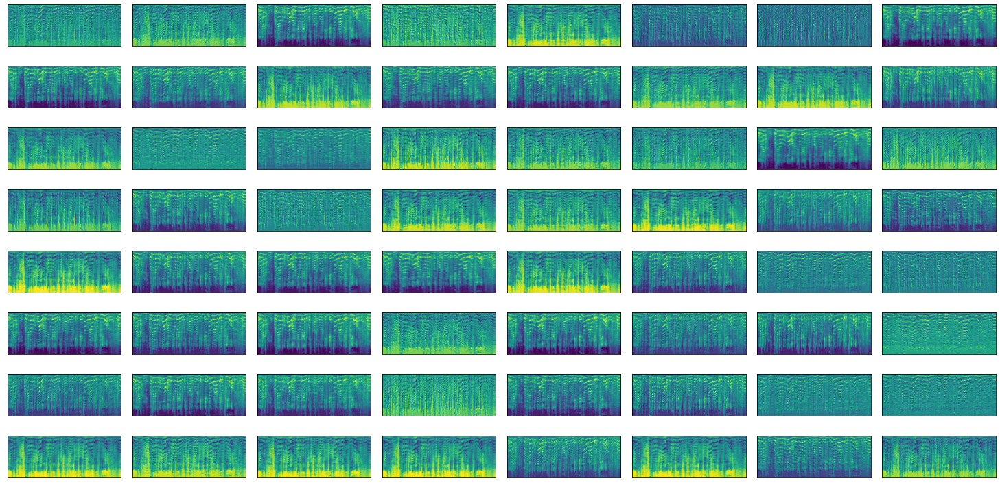

In [123]:
visualize_feature(model,model.conv1,fst_idx, audio)


##Visualizing the next input (different label to first)  from conv1 Layer

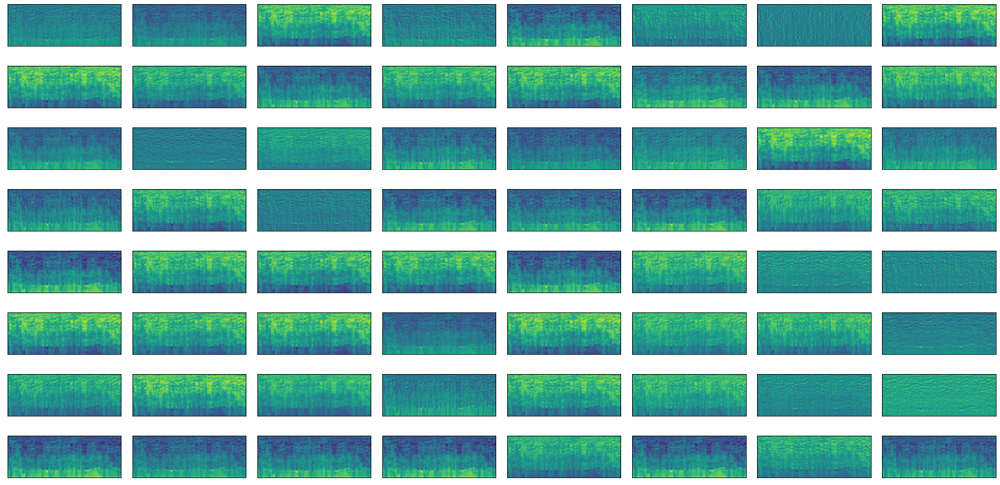

In [126]:
visualize_feature(model,model.conv1,snd_idx, audio)


##Visualizing the first input from second conv2 Layer



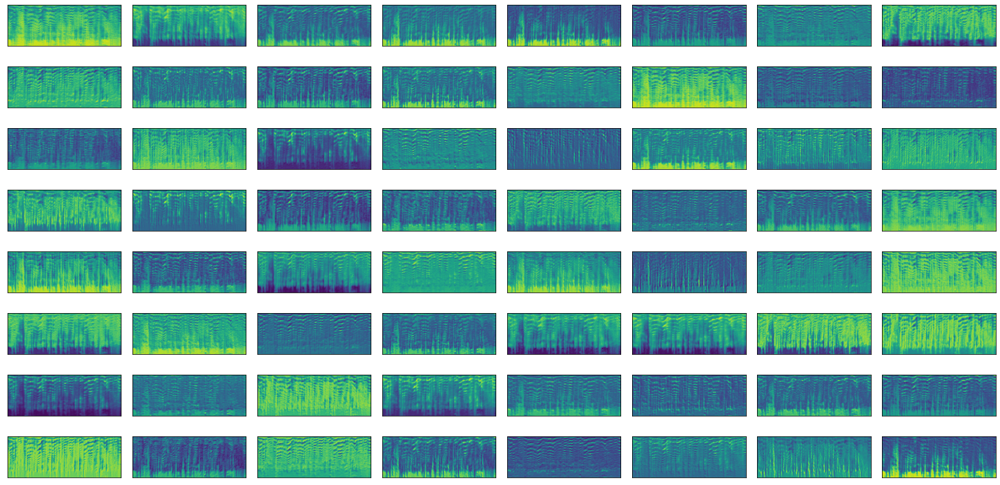

In [124]:
visualize_feature(model,model.conv2,fst_idx, audio)

##Visualizing the next input (different label to first) from second conv2 Layer


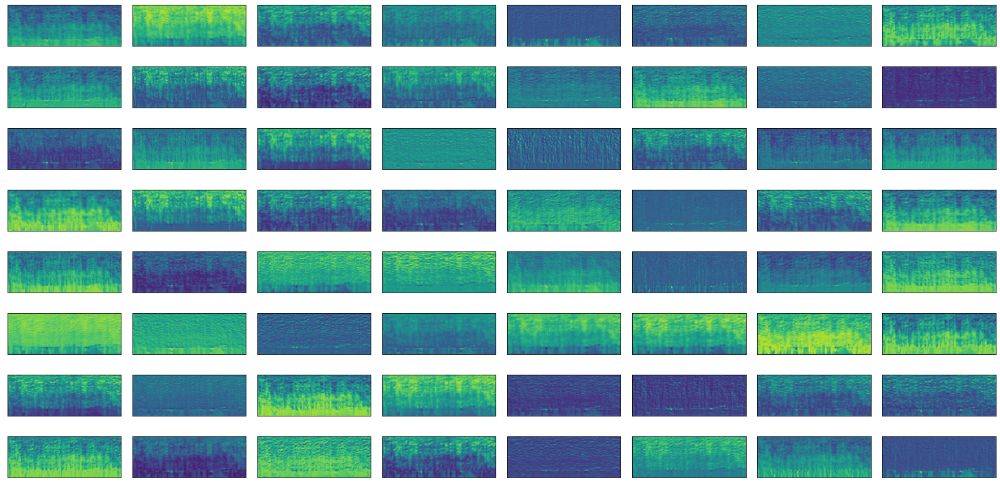

In [125]:
visualize_feature(model,model.conv2,snd_idx, audio)

#Visualizing filters from intermediate layers 

In [129]:

def plot_filters_single_channel(t):
    #kernels depth * number of kernels
    nplots = t.shape[0]
    ncols = 12
    
    nrows = 1 + nplots//ncols
    #convert tensor to numpy image
    npimg = np.array(t.numpy(), np.float32)
    
    count = 0
    fig = plt.figure(figsize=(ncols, nrows))
    
    #looping through all the kernels in each channel
    for i in range(t.shape[0]):
        for j in range(1):
            count += 1
            ax1 = fig.add_subplot(nrows, ncols, count)
            npimg = np.array(t[i, j].numpy(), np.float32)
            npimg = (npimg - np.mean(npimg)) / np.std(npimg)
            npimg = np.minimum(1, np.maximum(0, (npimg + 0.5)))
            ax1.imshow(npimg, cmap='gray')
            ax1.set_title(str(i) + ',' + str(j))
            ax1.axis('off')
            ax1.set_xticklabels([])
            ax1.set_yticklabels([])
   
    plt.tight_layout()
    plt.show()

def plot_filters_multi_channel(t):
    #get the number of kernals
    num_kernels = t.shape[0]    
    
    #define number of columns for subplots
    num_cols = 12
    #rows = num of kernels
    num_rows = num_kernels
    
    #set the figure size
    fig = plt.figure(figsize=(num_cols,num_rows))
    
    #looping through all the kernels
    for i in range(t.shape[0]):
        ax1 = fig.add_subplot(num_rows,num_cols,i+1)
        
        #for each kernel, we convert the tensor to numpy 
        npimg = np.array(t[i].numpy(), np.float32)
        #standardize the numpy image
        npimg = (npimg - np.mean(npimg)) / np.std(npimg)
        npimg = np.minimum(1, np.maximum(0, (npimg + 0.5)))
        npimg = npimg.transpose((1, 2, 0))
        ax1.imshow(npimg)
        ax1.axis('off')
        ax1.set_title(str(i))
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        
    plt.savefig('myimage.png', dpi=100)    
    plt.tight_layout()
    plt.show()


def plot_weights(model_layer, single_channel = True):

  #getting the weight tensor data
  weight_tensor = model_layer.weight.data.cpu()
  if single_channel:
      plot_filters_single_channel(weight_tensor)
     
  else:
    if weight_tensor.shape[1] == 3:
      plot_filters_multi_channel(weight_tensor)
    else:
      print("Can only plot weights with three channels with single channel = False")



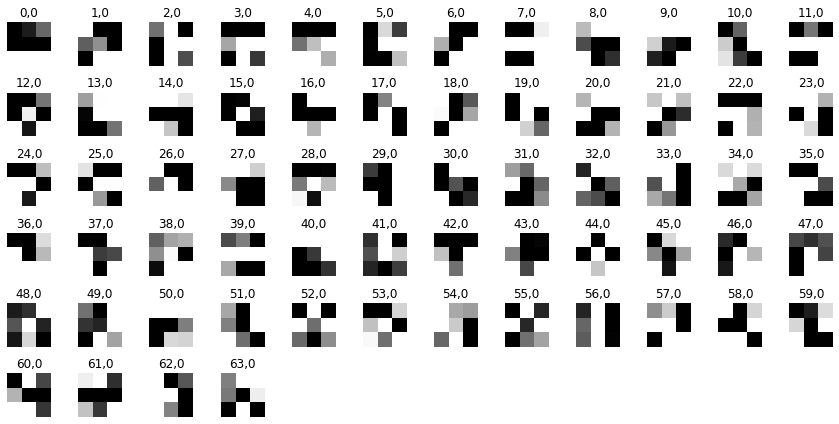

In [131]:
plot_weights (KAISD_pretrained_shallow.conv1, True)

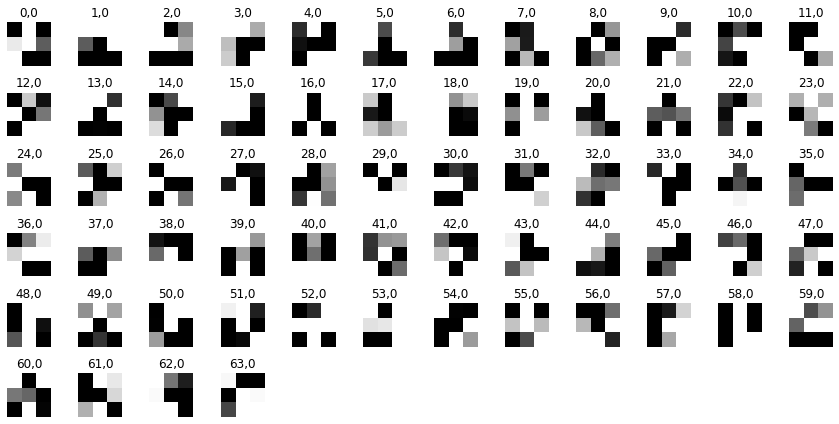

In [133]:
plot_weights ( KAISD_naive_shallow.conv2, True)